# **End- to- end Multi-class Gog Breed Classification**
This notebook builds an end to end multi-class image classifier using tensorflow

## 1. Problem
Idendifying  the breed of a dog given an image of a dog

## 2. Data
The data we' re using is from Kaggle's dog breed identication competition.
https://www.kaggle.com/c/dog-breed-identification/data
## 3. Evaluation
The evaluation is file with prediction probabilities for each dog of each image.

## 4. Features
* we are dealing with images (unstructured data).
* There are 120 breds of dogs ( this mean there are 120 different classes).


In [ ]:
#!unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
print(tf.__version__)
print(hub.__version__)
print("GPU", "available (Yessss!!!!!!1)" if tf.config.list_physical_devices("GPU") else ("no available"))

2.18.0
0.16.1
GPU available (Yessss!!!!!!1)


In [ ]:
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: xlabel='breed'>

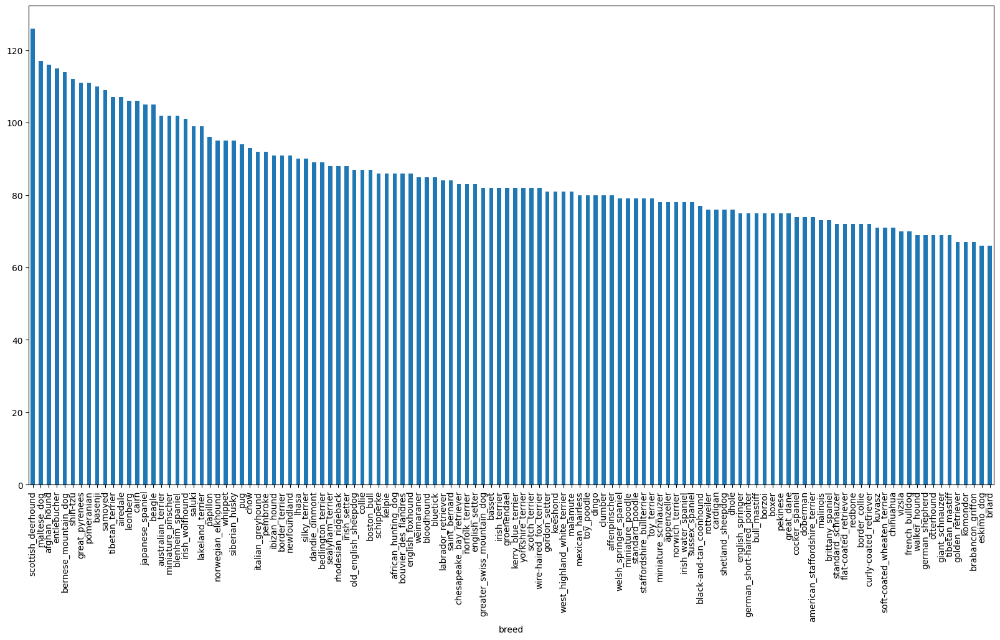

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize =(20,10))

In [ ]:
labels_csv["breed"].value_counts()

,count
breed,
scottish_deerhound,126
maltese_dog,117
afghan_hound,116
entlebucher,115
bernese_mountain_dog,114
...,...
golden_retriever,67
komondor,67
brabancon_griffon,67


In [ ]:
labels_csv["breed"].value_counts().median()

82.0

In [ ]:
filenames =["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

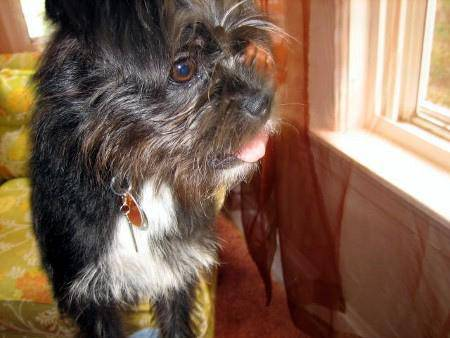

In [ ]:
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/00ca18751837cd6a22813f8e221f7819.jpg")

In [ ]:
import os
os.listdir("drive/MyDrive/Dog Vision/train/")[:10]

['e79578de293a0b46e92448ce8f8bb69f.jpg',
 'de0966a23cecbb9f481714b059c8bcd3.jpg',
 'dc17875272a541c7c8afa2a8451e801d.jpg',
 'deb88665ad11440ea55963b57e9ad79c.jpg',
 'e47a26a0b4510b25250f654577207ed3.jpg',
 'dbde111456535431c6caedfa5b8c8dea.jpg',
 'e7f4f3c25291884f2dfe7c60051d6949.jpg',
 'e450c72e96ce47b6c327c671ea8e85c0.jpg',
 'e5470144eceb4e454681874ffe3e7e78.jpg',
 'e97b337794ab4b95db5e2622156de547.jpg']

In [ ]:
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/"))== len(filenames):
  print("Filenames match actual amount of files!!! proceed.")
else:
  print("Filenames do not match actual amount of file, check the target directory.")

Filenames match actual amount of files!!! proceed.


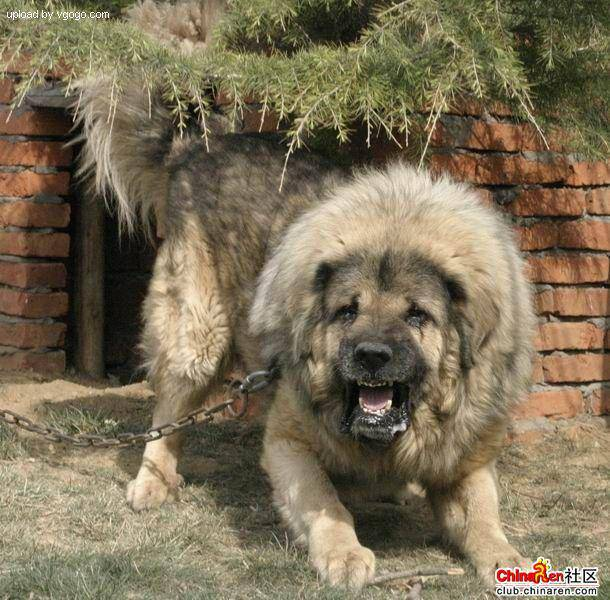

In [ ]:
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

In [ ]:
import numpy as np
labels =labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directionies")

Number of labels matches number of filenames!


In [ ]:
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
print(labels[0])
print(np.where(unique_breeds == labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# setup x & y varaibles
x = filenames
y =boolean_labels

In [ ]:
len(filenames)

10222

In [ ]:
NUM_IMAGES = 1000 #@param{type: "slider", min: 1000, max:10222, step:1000}

In [ ]:
from sklearn.model_selection import train_test_split
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(x_train), len(x_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [ ]:
x_train[:5], y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

In [ ]:
len(labels_csv)

10222

In [ ]:
#Preprocessing Images (turning images into Tensors)
# convert image to numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
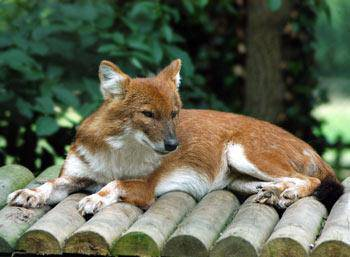

In [ ]:
image

In [ ]:
image.max(), image.min()

(np.uint8(255), np.uint8(0))

In [ ]:
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

In [ ]:
tf.constant(image[:2])

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [ ]:
# Define image size
IMG_SIZE =224
# create a function for preprocessing images
def process_images(image_path):
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical tensor with 3 colour channels (Red, Green, Blue)
  image =tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image =tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired  value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image


In [ ]:
# Turning our data into batches
# create simple function to return a tuple (image, label)
def get_image_label(image_path,label):
  image = process_images(image_path)
  return image, label

In [ ]:
(process_images(x[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
# define batch size, 32 is a good start
BATCH_SIZE = 32

# create a function to turn data into batches
def create_data_batches(x, y =None, batch_size =32, valid_data =False, test_data =False):
  if test_data:
    print("Creating test data batches")
    data =tf.data.Dataset.from_tensor_slices((tf.constant(x)))
    data_batch = data.map(process_images).batch(BATCH_SIZE)
    return data_batch
  elif valid_data:
    print("Creating Validation data batch")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print("Create training data batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))
    data =data.shuffle(buffer_size=len(x))
    data =data.map(get_image_label)
    data_batch = data.batch(BATCH_SIZE)
  return data_batch


In [ ]:
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val, y_val, valid_data =True)

Create training data batches
Creating Validation data batch


In [ ]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
import matplotlib.pyplot as plt

def show_25_images(image, labels):
  plt.figure(figsize=(10, 10))
  for i in range(25):
    ax =plt.subplot(5, 5, i+1)
    plt.imshow(image[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

In [ ]:
train_image, train_labels = next(train_data.as_numpy_iterator())
train_image, train_labels

(array([[[[4.68636215e-01, 4.82843876e-01, 4.38892305e-01],
          [4.34918463e-01, 4.60690171e-01, 4.12510186e-01],
          [4.54478323e-01, 4.97930706e-01, 4.43028748e-01],
          ...,
          [4.34561253e-01, 5.04919529e-01, 2.88602978e-01],
          [3.98232281e-01, 4.98057306e-01, 2.69609779e-01],
          [3.74098837e-01, 4.83902752e-01, 2.49886632e-01]],
 
         [[4.34313059e-01, 4.62795556e-01, 4.21180695e-01],
          [4.30683166e-01, 4.68809187e-01, 4.25641447e-01],
          [4.50397462e-01, 4.98083025e-01, 4.50719625e-01],
          ...,
          [4.39178973e-01, 5.10709047e-01, 3.05625111e-01],
          [3.90670598e-01, 4.94417191e-01, 2.53402412e-01],
          [3.46455574e-01, 4.60181087e-01, 2.09113166e-01]],
 
         [[4.15017545e-01, 4.62295204e-01, 4.23824698e-01],
          [4.00840372e-01, 4.50586498e-01, 4.09684926e-01],
          [4.44269449e-01, 4.94114786e-01, 4.52844918e-01],
          ...,
          [4.27214593e-01, 5.01336336e-01, 3.1526

In [ ]:
len(train_image), len(train_labels)

(32, 32)

In [ ]:
unique_breeds[y[0].argmax()]

'boston_bull'

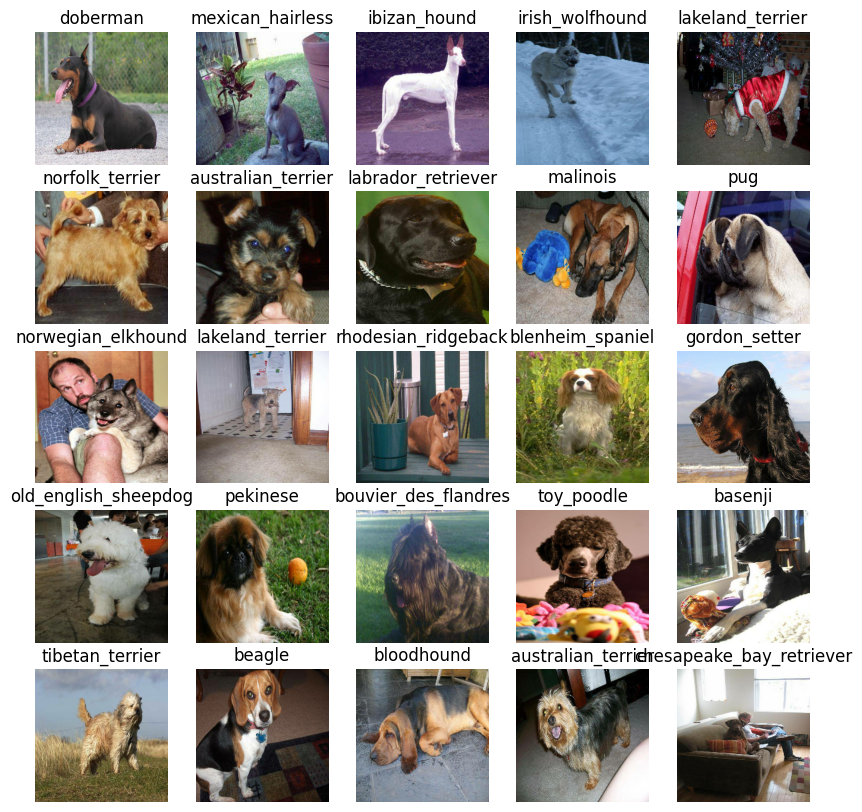

In [ ]:
show_25_images(train_image, train_labels)

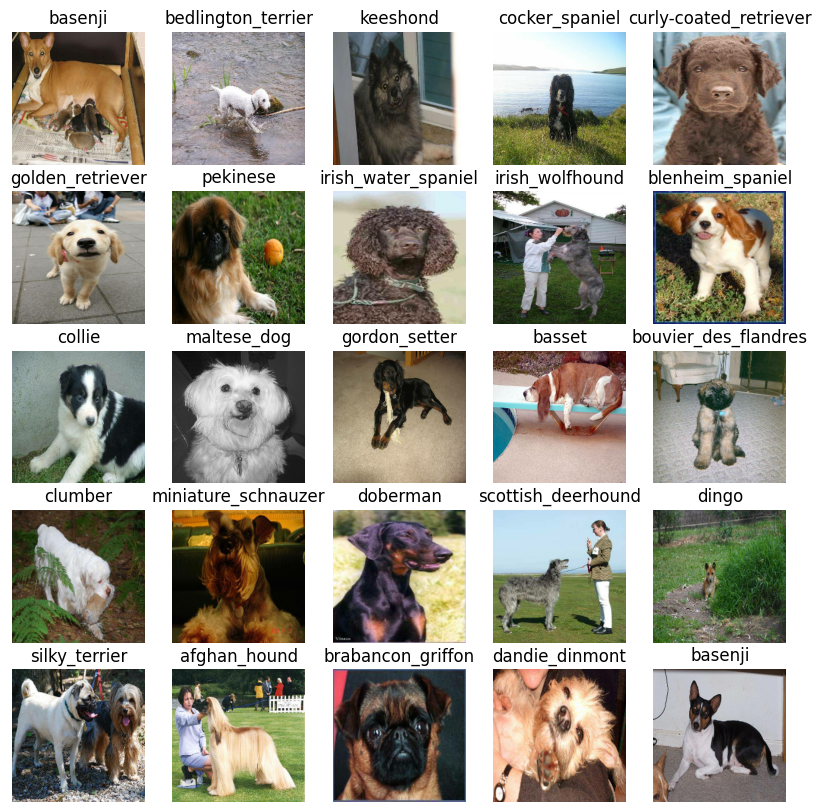

In [ ]:
val_image, val_labels = next(train_data.as_numpy_iterator())
show_25_images(val_image, val_labels)

In [ ]:
#setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from Tensorflow Hub
#MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/5"


In [ ]:
from tensorflow.keras.applications import MobileNetV2
base_model = MobileNetV2(input_shape=(224, 224, 3),
                         include_top=False,  #  using the top classification layer
                         weights='imagenet')
base_model.summary()


In [ ]:
from tensorflow.keras.applications import MobileNetV2
do_fine_tuning = False #@param{type: "boolean"}
# Create a function which build a keras model
def create_model(input_shape =INPUT_SHAPE, output_shape =OUTPUT_SHAPE, model_url =MODEL_URL):
  print("Building model with:", MODEL_URL)

  # setup the model layers
  model = tf.keras.Sequential([
      tf.keras.layers.InputLayer(shape=(IMG_SIZE, IMG_SIZE, 3)),
      hub.KerasLayer(MODEL_URL, trainable=do_fine_tuning),
      tf.keras.layers.Dropout(rate=0.2),
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax",
                            kernel_regularizer=tf.keras.regularizers.l2(0.0001))
      ])

  # compile the model
  model.compile(
      loss =tf.keras.losses.CategoricalCrossentropy(),
      optimizer =tf.keras.optimizers.Adam(),
      metrics =["accuracy"]
  )
  # Build the model
  model.build(INPUT_SHAPE)
  return model
model = create_model()
model.summary()


In [ ]:
model = create_model()
model.summary()


Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/5


ValueError: Only instances of `keras.Layer` can be added to a Sequential model. Received: <tensorflow_hub.keras_layer.KerasLayer object at 0x7cd26857dc90> (of type <class 'tensorflow_hub.keras_layer.KerasLayer'>)

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

def create_tensorboard_callback():
  logdir = os.path.join("drive/MYDrive/Dog Vision/logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
early_stopping =tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                 patience=3)

In [ ]:
# Setup number of epochs
NUM_EPOCHS = 1000 #@param{type: "slider", min: 1000, max:10222, step:1000}

In [ ]:
# Build a function to train and return a trained model
def train_model():
  # create a model
  model =create_model()

  # create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # fit the model to th edata passing it the callbacks we create
  model.fit(x =train_data,
            epoochs =NUM_EPOCHS,
            validation_data =val_data,
            validation_freq =1,
            callbacks =[tensorboard, early_stopping])

  return model


In [ ]:
model =train_model()

ValueError: Exception encountered when calling layer 'keras_layer_6' (type KerasLayer).

A KerasTensor is symbolic: it's a placeholder for a shape an a dtype. It doesn't have any actual numerical value. You cannot convert it to a NumPy array.

Call arguments received by layer 'keras_layer_6' (type KerasLayer):
  • inputs=<KerasTensor shape=(None, 224, 224, 3), dtype=float32, sparse=False, name=keras_tensor_9>
  • training=None

In [ ]:
%tensorboard --logdir drive/MY\Drive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

In [ ]:
# Make prediction on the validation data (not used to train on)
predictions =model.predict(val_data, verbose =1)

NameError: name 'model' is not defined

In [ ]:
np.sum(predictions[0])

In [ ]:
# first prediction
index =42
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

In [ ]:
def get_pred_label(prediction_probabilities):

  return unique_breeds[np.argmax(prediction_probabilities)]

pred_label =get_image_label(predictions[81])
pred_label

In [ ]:
# create a fuction to unbatch data
def unbatchify(data):

  images_ = []
  labels_ = []
  # loop throgh unbatch data
  for image, label in val_data.unbatch().as_numpy_iterator():
     images_.append(image)
     labels_.append(unique_breeds[np.argmax(labels)])

     image_[0], label_[0]

  return images_, labels_

  # unbatchify the validation data
  val_image, val_labels = unbatchify(val_data)
  val_image[0],  val_labels[0]

In [ ]:
def plot_pred(prediction_probabilities, labels, image, n=1):

  pred_prob, true_label, image =prediction_probabilities[n], labels[n], image[n]

  pred_label = get_pred_label(pred_prob)

  # plot image & remove tick
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if th prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  # change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}" .format(pred_label,
                                     np.max(pred_prob)*100,
                                     true_label),
                                     color = color)

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          image= val_image,
          n=77)

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n =1):

  #
  pred_prob, true_label =prediction_probabilities[n], labels[n]

  # get the predicted label
  pred_prob = get_pred_label(pred_prob)

  # find the top 10 prediction confidence indexes
  top_10_pred_indexes =pred_prob.argsort()[-10:][::-1]
  # find the top 10 prediction confidence values
  top_10_pred_values = pred_prob(top_10_pred_indexes)
  # find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color ="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels =top_10_pred_labels,
             rotation = "vertical")

  # change color of true label
  if np.isin (true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels =val_labels,
               n= 9)

In [ ]:
# Let's check out a few prediction and their differencs features
i_multiplier =0 #(0,1,2,..............)
num_row = 3
num_cols = 2
num_images = num_row*num_cols
plt.figure(figsize=(10*num_cols, 5*num_row))
for i in range(num_images):
  plt.subplot(num_row, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities = predictions,
              labels =val_labels,
              image = val_image,
              n = i+i_multiplier)
  plt.subplot(num_row, 2*num_cols, 2*i+1)
  plot_pred_conf(prediction_probabilities = predictions,
              labels =val_labels,
              image = val_image,
              n = i+i_multiplier)
  plt.tight_layout(h_pad=1.0)
  plt,show()


In [ ]:
# Create a function to save a model
def save_model(model, suffix =None):

  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/model",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".h5"
  pritn(f"Saving model to: {model_path}....")
  model.save(model_path)
  return model_path



In [ ]:
# Create a function to load a trainrd model
def load_model(model_path):

  print(f"Loading saved model from:{model_path}")

  model = tf.keras.models.load_model(model_path,
                                     custom_objects ={"KerasLayer":hub.KerasLayer})
  return model


In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix = "1000-images-mobilenetb2-Adam")


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

In [ ]:
# Create data batch with the full data set
full_data = create_data_batches(x, y)

In [ ]:
# Create a model for full model
full_model = create_model()

In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we cn't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "accuracy",
                                                             patience =3)

In [ ]:
# Fit the full model to the full data
full_model.fit(x =full_data,
               epochs =NUM_EPOCHS,
               callbacks =[full_model_tensorboard, full_model_early_stopping])

In [ ]:
# Load test image filenames
test_path = "drive/MyDrive/Dog Vision/test"
test_filenames =[test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

In [ ]:
# Create test data batch
test_batch = create_data_batches(test_filenames, test_data=True)

In [ ]:
test_data

In [ ]:
from re import VERBOSE
# Make prediction on test data batch using the loaded full model
test_predictions = loaded_full_model(test_data,
                                     VERBOSE=1)

In [ ]:
# Save predictions (numpy array) to csv file
np.savetxt("drive/MyDrive/Dog Vision/pred_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions (numy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/pred_array.csv", delimiter=",")


In [ ]:
#Create a pandas Dataframe with empty columns
preds_df =pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df

In [ ]:
#Append test image ID's to prediction DataFrame
test_ids =[os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
# Add the prediction probabilities to each dog breed
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

In [ ]:
# Save our predictions DataFrame to csv for submission to Kaggle
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index =False)

In [ ]:
# Get custom image filepath
custom_path = "drive/MyDrive/Dog Vision/my-dog-photos/"
custom_image_path = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_path, test_data=True)
custom_data

In [ ]:
custom_preds = loaded_full_model.predict(custom_data)

In [ ]:
custom_preds.shape

In [ ]:
# get custom image prediction labels
custom_preds_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_preds_labels

In [ ]:
# Get custom image (our unbatchify() fuction )
custom_images =[]

for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

In [ ]:
# Check custom images predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_preds_labels[i])
  plt.imshow(image)